In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.13.0.post200
1.9.1


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load mutant data
#### Load mutant scRNA-seq data (The .h5ad file is converted from Seurat Objects from GEO GSE152766)

In [4]:
shr = sc.read_h5ad("/hpc/group/pbenfeylab/CheWei/scRNA-seq/Integrated_Objects/shr_integrated.h5ad")

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [5]:
scr = sc.read_h5ad("/hpc/group/pbenfeylab/CheWei/scRNA-seq/Integrated_Objects/scr_integrated.h5ad")

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/anndata/compat/__init__.py:232: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


In [6]:
# Floored at 0, Ceiling at 10 and normalize to range 0-1
scr.X[scr.X < 0]=0
mmin = np.amin(scr.X)
nor = (np.amax(scr.X)-mmin)
scr.X = (scr.X-mmin)/nor
############################
shr.X[shr.X < 0]=0
mmin = np.amin(shr.X)
nor = (np.amax(shr.X)-mmin)
shr.X = (shr.X-mmin)/nor

In [7]:
## Subset only the T0 cells and remove those annotated as elongated or mature
scr = scr[np.array(pd.Series(scr.obs['time.celltype.anno.Li.crude']).str.match("^Pro") & pd.Series(scr.obs['consensus.time.group']).str.match("T0")),:]

In [8]:
mi = match(np.array(gene_list['features']).tolist(),scr.var['features'].tolist())
mi = np.array(mi)

scrx = pd.DataFrame(scr.X.copy())
scrx[len(scrx.columns)] = pd.Series(0.0, index=np.arange(len(scrx)))
mi[np.where(mi==None)[0]] = len(scrx.columns)-1
scrx = scrx[pd.Series(mi)]
scrx.columns = np.array(gene_list['features']).tolist()

batch_size = 2000
idx = np.random.choice(range(len(scrx)),batch_size)
scrx = scrx.loc[idx]

In [9]:
## Randomly sampled 2000 scr stem cells
scrx

,AT1G05260,AT3G59370,AT2G36100,AT1G12080,AT1G12090,AT4G11290,AT5G42180,AT5G66390,AT2G32300,AT2G02130,...,AT4G06395,AT3G55440,AT3G03100,AT5G54760,AT2G33040,AT2G42680,AT5G11770,AT5G08290,AT5G53300,AT5G64400
52,0.0,0.551133,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.007576,0.167403,0.000000,0.000000,0.000000,0.121428,0.000000,0.0
100,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.014082,0.018809,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
23,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.064540,0.012376,0.007524,0.019431,0.000000,0.000345,0.023127,0.000000,0.0
133,0.0,0.000000,0.068104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.008329,0.000000,0.025216,0.028603,0.000000,0.0
172,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.011839,0.009481,0.000000,0.042529,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.001410,0.000000,0.000000,0.000000,0.000000,0.000000,0.035820,0.0
164,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.017421,0.040250,0.003452,0.014020,0.000000,0.024728,0.000000,0.071509,0.003007,0.0
109,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.104939,0.000000,0.001219,0.002244,0.025827,0.000000,0.0
30,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.020801,0.000000,0.000000,0.000000,0.000000,0.0


In [10]:
sum(scrx.sum(axis=1))

1600079.3230119227

In [11]:
## Subset only the T0 cells and remove those annotated as elongated or mature
shr = shr[np.array(pd.Series(shr.obs['time.celltype.anno.Li.crude']).str.match("^Pro") & pd.Series(shr.obs['consensus.time.group']).str.match("T0")),:]

In [12]:
mi = match(np.array(gene_list['features']).tolist(),shr.var['features'].tolist())
mi = np.array(mi)

shrx = pd.DataFrame(shr.X.copy())
shrx[len(shrx.columns)] = pd.Series(0.0, index=np.arange(len(shrx)))
mi[np.where(mi==None)[0]] = len(shrx.columns)-1
shrx = shrx[pd.Series(mi)]
shrx.columns = np.array(gene_list['features']).tolist()

batch_size = 2000
idx = np.random.choice(range(len(shrx)),batch_size)
shrx = shrx.loc[idx]

In [13]:
## Randomly sampled 2000 shr stem cells
shrx

,AT1G05260,AT3G59370,AT2G36100,AT1G12080,AT1G12090,AT4G11290,AT5G42180,AT5G66390,AT2G32300,AT2G02130,...,AT4G06395,AT3G55440,AT3G03100,AT5G54760,AT2G33040,AT2G42680,AT5G11770,AT5G08290,AT5G53300,AT5G64400
193,0.000000,0.019039,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.021130,0.0,0.000000,0.000000,0.000000,0.000000,0.033461,0.000000,0.000000
146,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.026618,0.008348,0.000000
411,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
360,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
74,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.050354,0.020214,0.0,0.009773,0.000637,0.029871,0.002019,0.000000,0.000000,0.011441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004383
578,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.076647,0.0,0.000000,0.000000,0.000000,0.000000,0.027485,0.025804,0.000000
574,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.064923,0.000000
436,0.548649,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [14]:
sum(shrx.sum(axis=1))

1396024.9262078388

In [15]:
input_size = 17513
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model (Evaluate)

In [16]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"best_ALL_1130_continue.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

### Provide shr input data

In [17]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [18]:
xm = torch.tensor(np.array(shrx), dtype=torch.float32)
x = torch.stack([xm,xm,xm,xm,xm,xm,xm,xm,xm,xm,xm],dim=1)

In [19]:
## Initialize hidden state
pred_h = model.init_hidden(batch_size)

# t0 and t1 prediction based on data from the first two time points
t0 = model.generate_current(x, pred_h, 0)
t1 = model.generate_next(x, pred_h, 0)
update_x = torch.stack([t0,t1,t1,t1,t1,t1,t1,t1,t1,t1,t1],dim=1)

## predict t1 label
y1, pred_h = model.predict_proba(update_x, pred_h, 1)
y1 = [num2class[i] for i in np.argmax(y1.cpu().detach().numpy(), axis=1)]

t2 = model.generate_next(update_x, pred_h, 1)
update_x = torch.stack([t0,t1,t2,t2,t2,t2,t2,t2,t2,t2,t2],dim=1)

y2, pred_h = model.predict_proba(update_x, pred_h, 2)
y2 = [num2class[i] for i in np.argmax(y2.cpu().detach().numpy(), axis=1)]

t3 = model.generate_next(update_x, pred_h, 2)
update_x = torch.stack([t0,t1,t2,t3,t3,t3,t3,t3,t3,t3,t3],dim=1)

y3, pred_h = model.predict_proba(update_x, pred_h, 3)
y3 = [num2class[i] for i in np.argmax(y3.cpu().detach().numpy(), axis=1)]

t4 = model.generate_next(update_x, pred_h, 3)
update_x = torch.stack([t0,t1,t2,t3,t4,t4,t4,t4,t4,t4,t4],dim=1)

y4, pred_h = model.predict_proba(update_x, pred_h, 4)
y4 = [num2class[i] for i in np.argmax(y4.cpu().detach().numpy(), axis=1)]

t5 = model.generate_next(update_x, pred_h, 4)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t5,t5,t5,t5,t5],dim=1)

y5, pred_h = model.predict_proba(update_x, pred_h, 5)
y5 = [num2class[i] for i in np.argmax(y5.cpu().detach().numpy(), axis=1)]

t6 = model.generate_next(update_x, pred_h, 5)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t6,t6,t6,t6],dim=1)

y6, pred_h = model.predict_proba(update_x, pred_h, 6)
y6 = [num2class[i] for i in np.argmax(y6.cpu().detach().numpy(), axis=1)]

t7 = model.generate_next(update_x, pred_h, 6)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t7,t7,t7],dim=1)

y7, pred_h = model.predict_proba(update_x, pred_h, 7)
y7 = [num2class[i] for i in np.argmax(y7.cpu().detach().numpy(), axis=1)]

t8 = model.generate_next(update_x, pred_h, 7)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t8,t8],dim=1)

y8, pred_h = model.predict_proba(update_x, pred_h, 8)
y8 = [num2class[i] for i in np.argmax(y8.cpu().detach().numpy(), axis=1)]

t9 = model.generate_next(update_x, pred_h, 8)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t9],dim=1)

y9, pred_h = model.predict_proba(update_x, pred_h, 9)
y9 = [num2class[i] for i in np.argmax(y9.cpu().detach().numpy(), axis=1)]

t10 = model.generate_next(update_x, pred_h, 9)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10],dim=1)

y10, pred_h = model.predict_proba(update_x, pred_h, 10)
y10 = [num2class[i] for i in np.argmax(y10.cpu().detach().numpy(), axis=1)]

In [20]:
t0 = t0.to(device).detach().numpy()
t1 = t1.to(device).detach().numpy()
t2 = t2.to(device).detach().numpy()
t3 = t3.to(device).detach().numpy()
t4 = t4.to(device).detach().numpy()
t5 = t5.to(device).detach().numpy()
t6 = t6.to(device).detach().numpy()
t7 = t7.to(device).detach().numpy()
t8 = t8.to(device).detach().numpy()
t9 = t9.to(device).detach().numpy()
t10 = t10.to(device).detach().numpy()

In [21]:
pred_X = np.vstack((t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10))
pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
#pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
pred_T = ['t0']*batch_size + ['t1']*batch_size + ['t2']*batch_size + ['t3']*batch_size + ['t4']*batch_size + ['t5']*batch_size + ['t6']*batch_size + ['t7']*batch_size + ['t8']*batch_size+ ['t9']*batch_size + ['t10']*batch_size

In [22]:
pd.DataFrame(pred_X).to_csv("./pred_X_shr.csv", header=False)
pd.DataFrame(pred_Y).to_csv("./pred_Y_shr.csv")
pd.DataFrame(pred_T).to_csv("./pred_T_shr.csv")

In [23]:
adata = sc.read_csv('./pred_X_shr.csv', first_column_names=True)
pred_Y = pd.read_csv('./pred_Y_shr.csv')
pred_T = pd.read_csv('./pred_T_shr.csv')
adata.obs['celltype'] = pred_Y['0'].tolist()
adata.obs['timebin'] = pred_T['0'].tolist()
adata.var.index = gene_list['features']

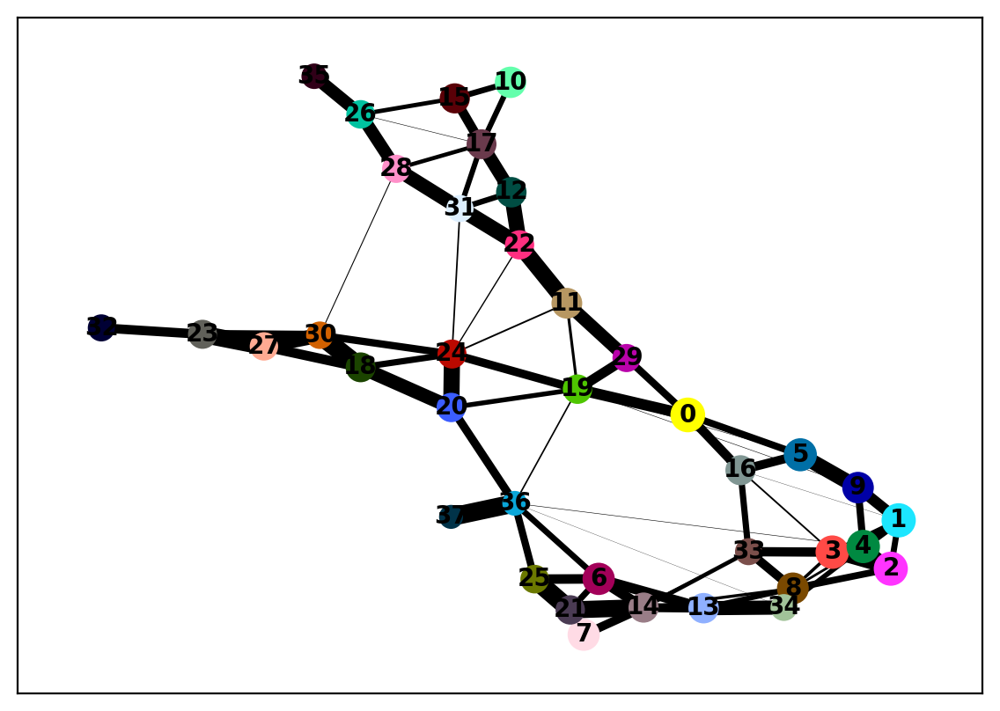

In [24]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata) 

In [25]:
sc.tl.umap(adata, init_pos='paga')

In [26]:
adata.uns['celltype_colors'] = np.array([ "#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f"], dtype=object)
adata.obs['celltype'] = pd.Categorical(adata.obs['celltype'], categories=["Stem Cell","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


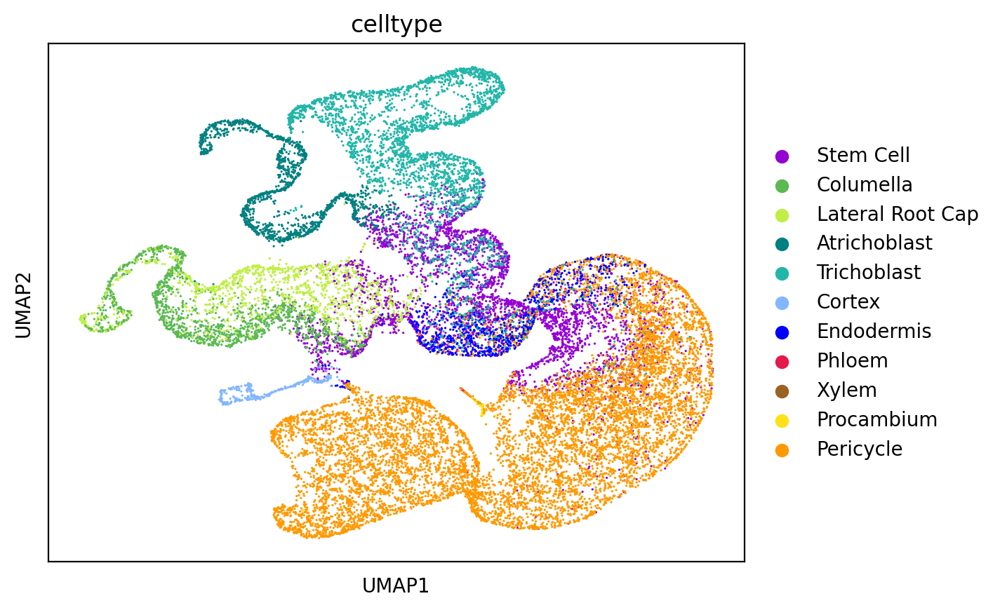

In [27]:
sc.pl.umap(adata, color=['celltype'])

In [28]:
adata.uns['timebin_colors'] = np.array([ '#5E4FA2', '#3288BD', '#66C2A5', '#ABDDA4', '#E6F598', '#FFFFBF', '#FEE08B', '#FDAE61', '#F46D43', '#D53E4F','#9E0142'])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


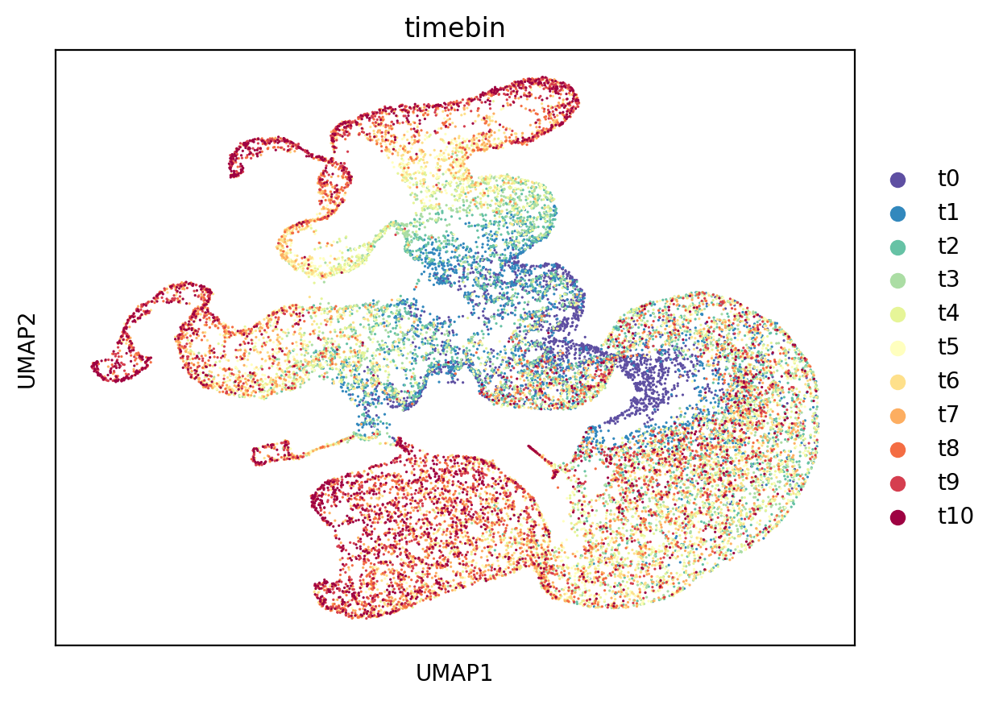

In [29]:
sc.pl.umap(adata, color=['timebin'])

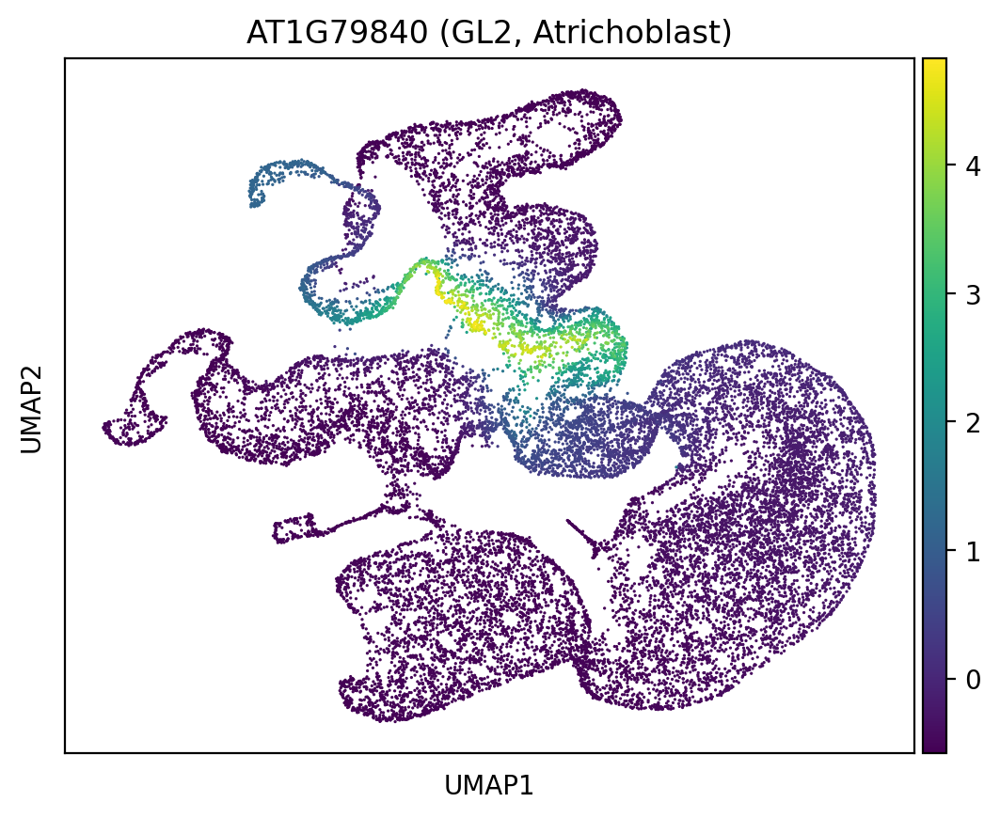

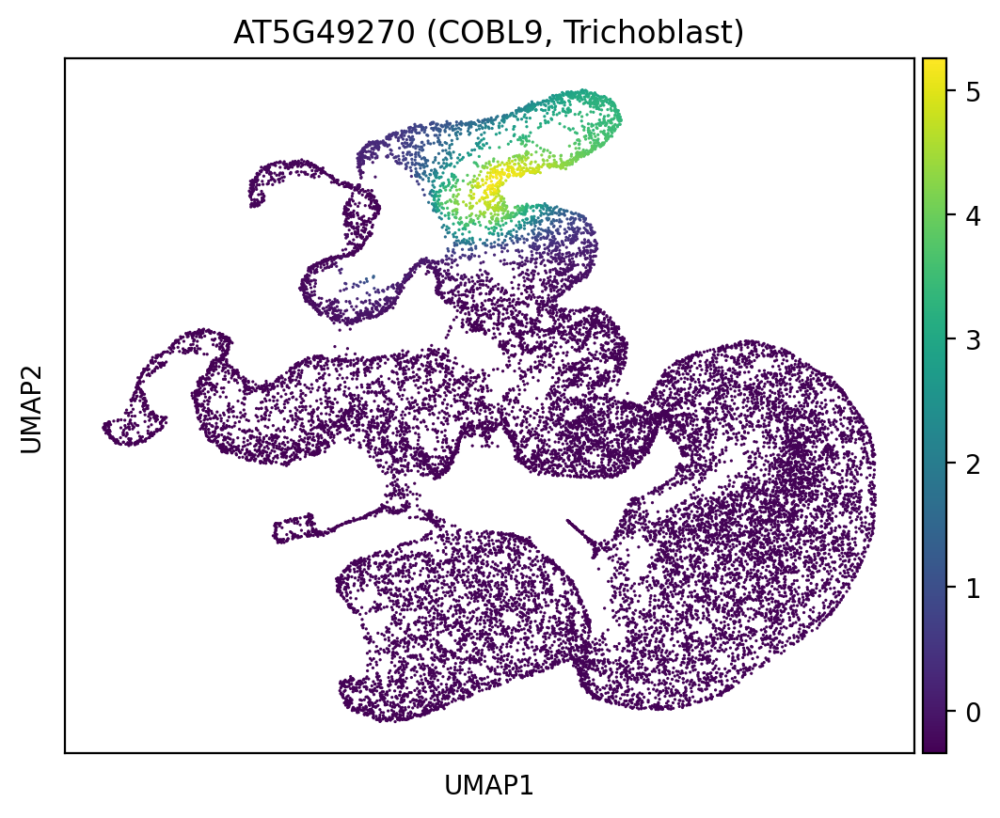

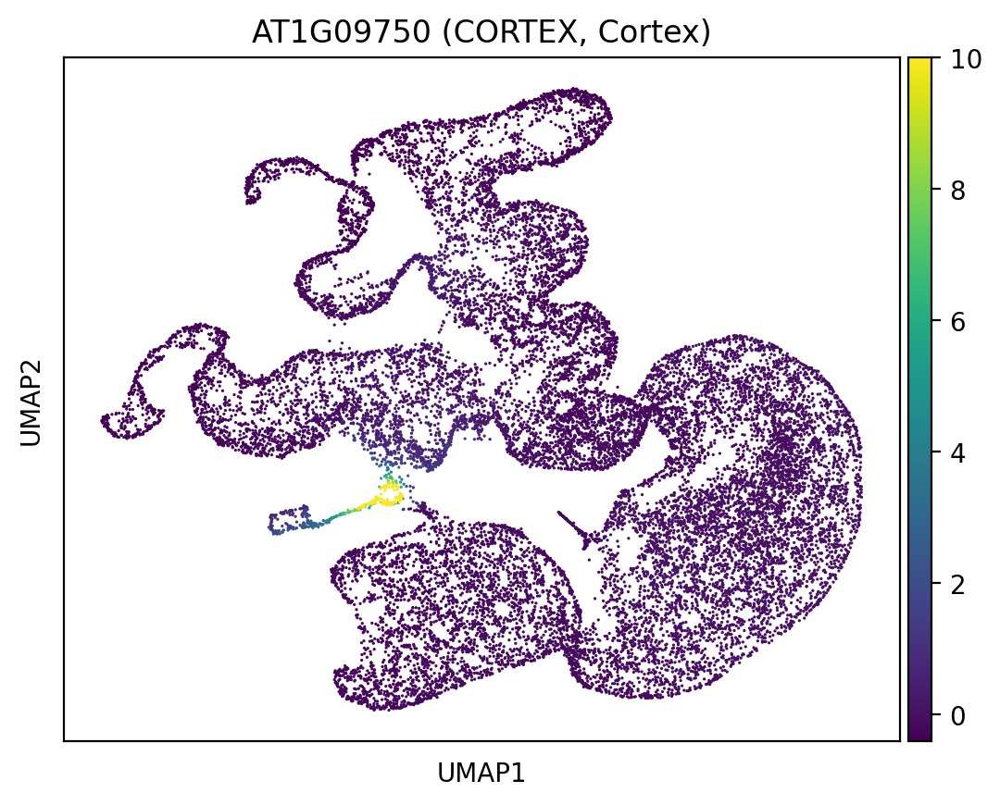

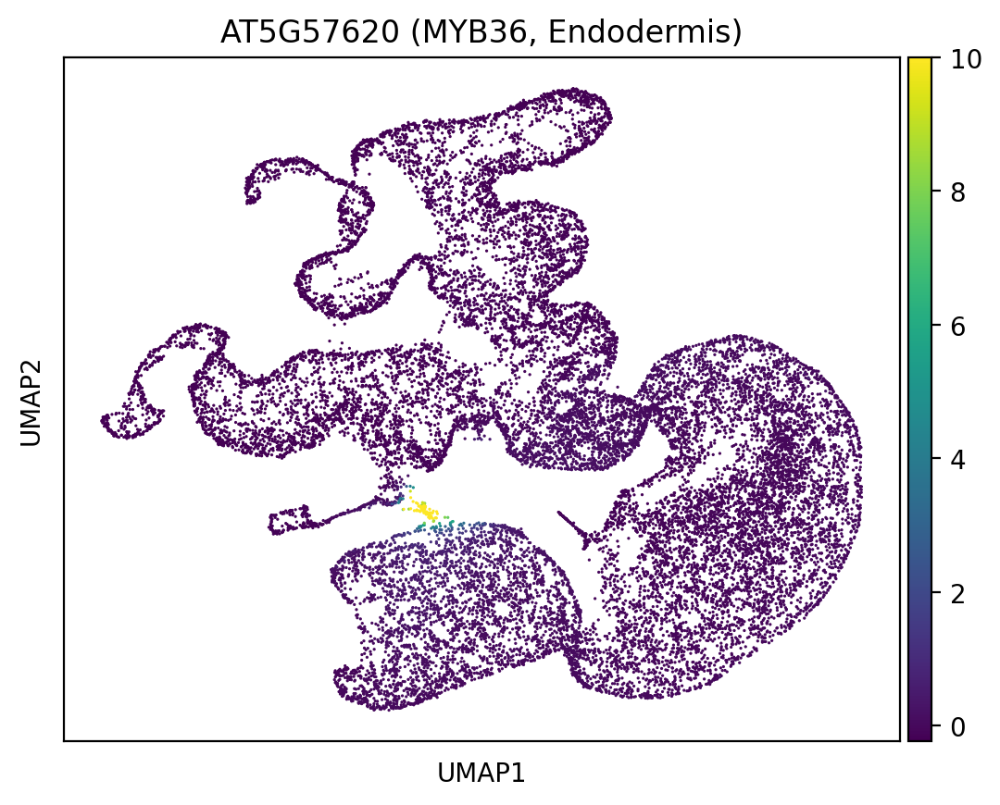

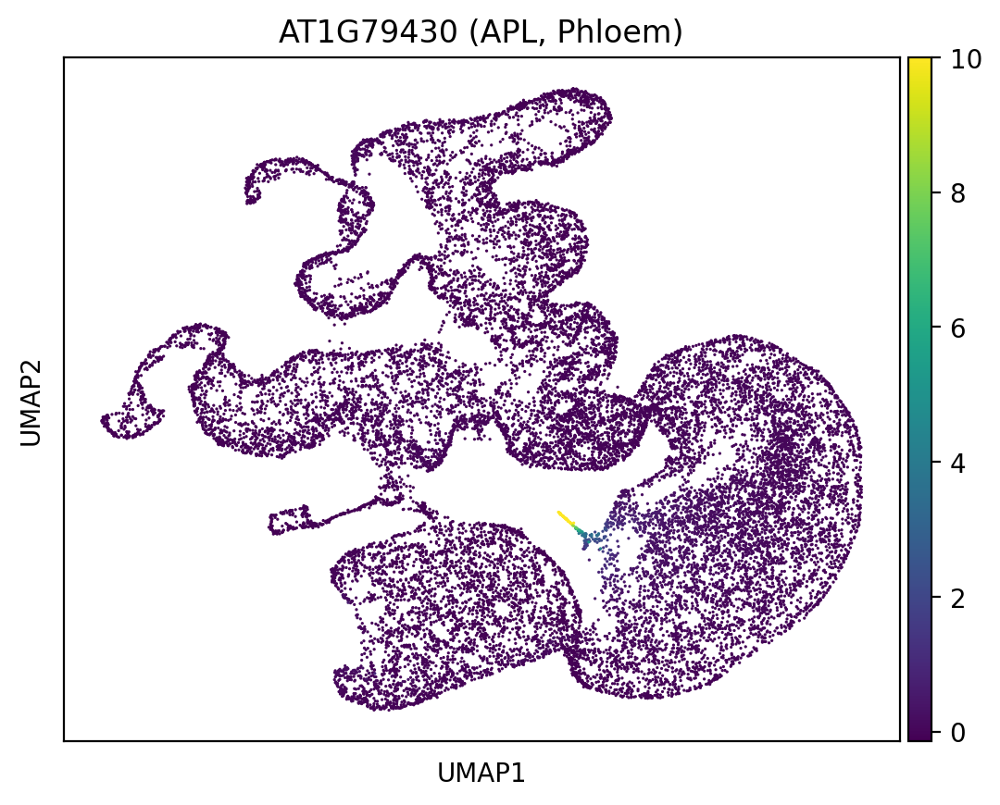

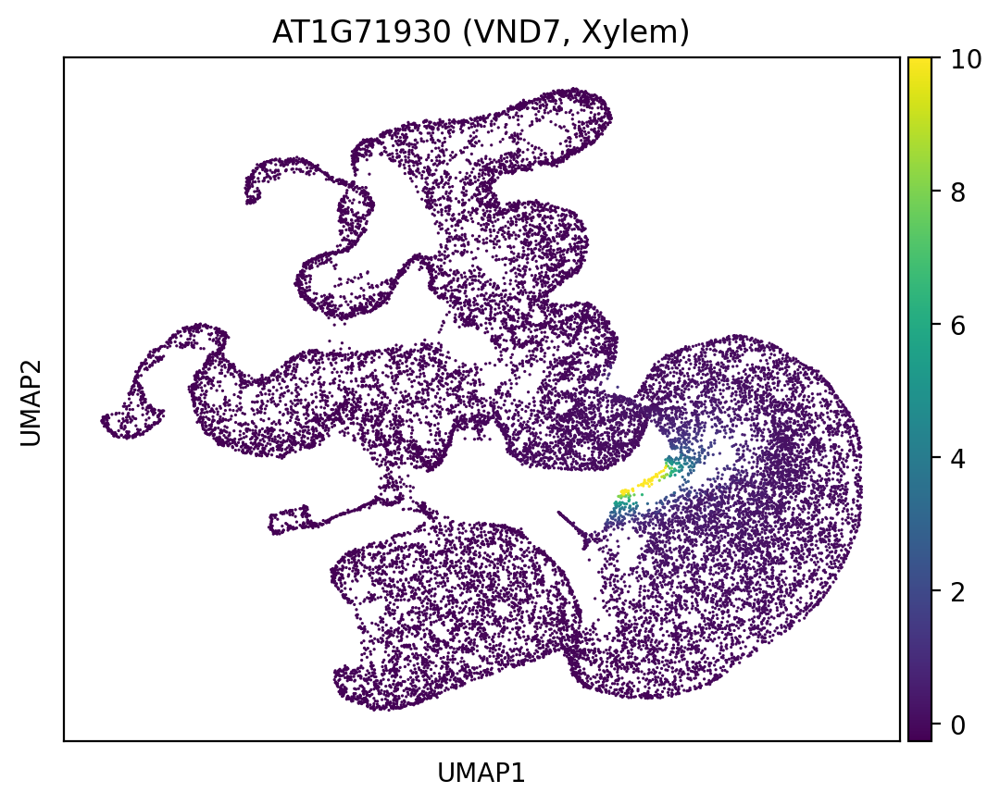

In [30]:
## AT1G79840
sc.pl.umap(adata, color='AT1G79840', title='AT1G79840 (GL2, Atrichoblast)')
## AT5G49270
sc.pl.umap(adata, color='AT5G49270', title='AT5G49270 (COBL9, Trichoblast)')
sc.pl.umap(adata, color='AT1G09750', title='AT1G09750 (CORTEX, Cortex)')
sc.pl.umap(adata, color='AT5G57620', title='AT5G57620 (MYB36, Endodermis)')
sc.pl.umap(adata, color='AT1G79430', title='AT1G79430 (APL, Phloem)')
sc.pl.umap(adata, color='AT1G71930', title='AT1G71930 (VND7, Xylem)')

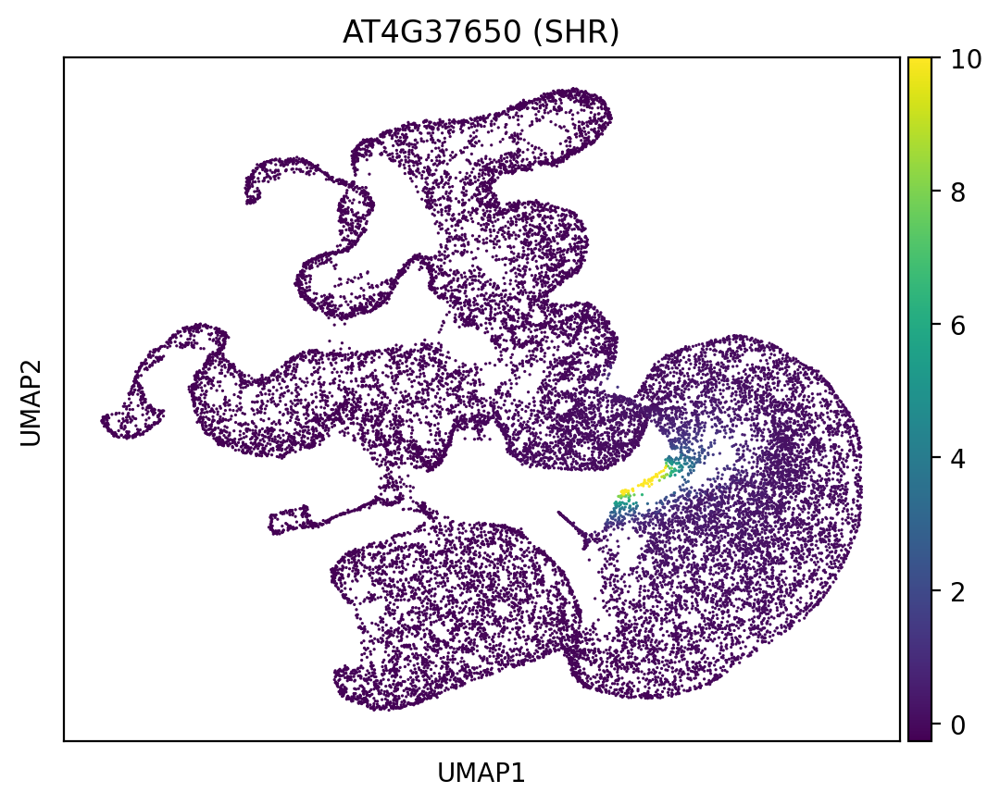

In [31]:
sc.pl.umap(adata, color='AT1G71930', title='AT4G37650 (SHR)')

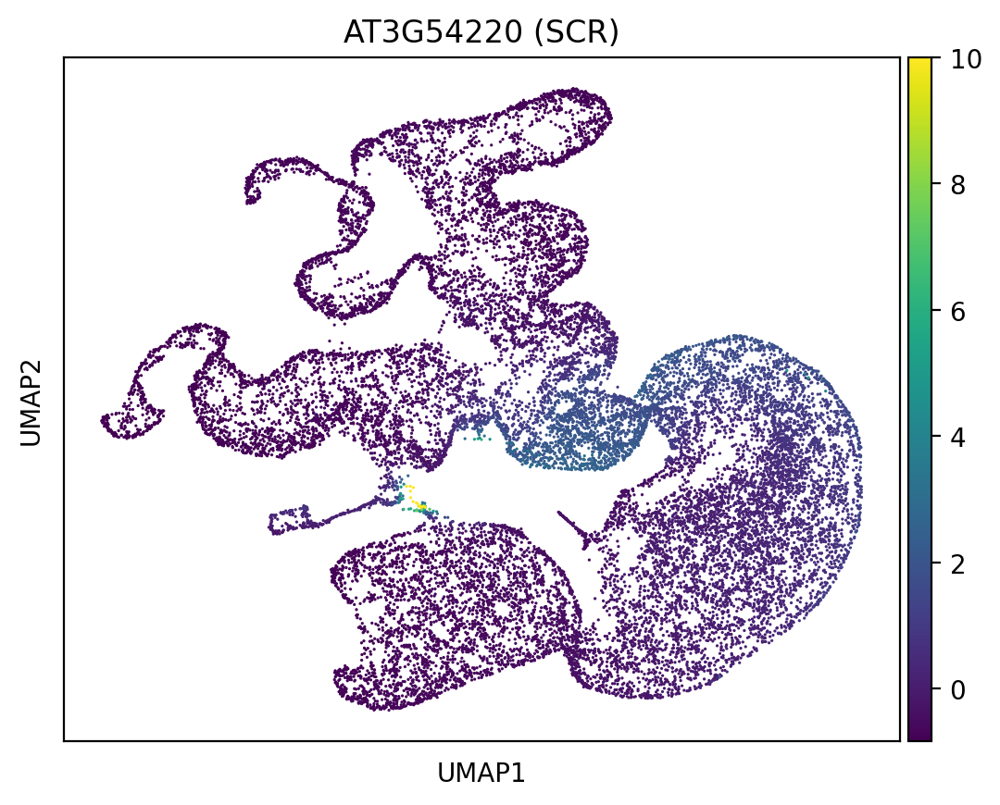

In [32]:
sc.pl.umap(adata, color='AT3G54220', title='AT3G54220 (SCR)')

### Provide scr input data

In [33]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [34]:
xm = torch.tensor(np.array(scrx), dtype=torch.float32)
x = torch.stack([xm,xm,xm,xm,xm,xm,xm,xm,xm,xm,xm],dim=1)

In [35]:
## Initialize hidden state
pred_h = model.init_hidden(batch_size)

# t0 and t1 prediction based on data from the first two time points
t0 = model.generate_current(x, pred_h, 0)
t1 = model.generate_next(x, pred_h, 0)
update_x = torch.stack([t0,t1,t1,t1,t1,t1,t1,t1,t1,t1,t1],dim=1)

## predict t1 label
y1, pred_h = model.predict_proba(update_x, pred_h, 1)
y1 = [num2class[i] for i in np.argmax(y1.cpu().detach().numpy(), axis=1)]

t2 = model.generate_next(update_x, pred_h, 1)
update_x = torch.stack([t0,t1,t2,t2,t2,t2,t2,t2,t2,t2,t2],dim=1)

y2, pred_h = model.predict_proba(update_x, pred_h, 2)
y2 = [num2class[i] for i in np.argmax(y2.cpu().detach().numpy(), axis=1)]

t3 = model.generate_next(update_x, pred_h, 2)
update_x = torch.stack([t0,t1,t2,t3,t3,t3,t3,t3,t3,t3,t3],dim=1)

y3, pred_h = model.predict_proba(update_x, pred_h, 3)
y3 = [num2class[i] for i in np.argmax(y3.cpu().detach().numpy(), axis=1)]

t4 = model.generate_next(update_x, pred_h, 3)
update_x = torch.stack([t0,t1,t2,t3,t4,t4,t4,t4,t4,t4,t4],dim=1)

y4, pred_h = model.predict_proba(update_x, pred_h, 4)
y4 = [num2class[i] for i in np.argmax(y4.cpu().detach().numpy(), axis=1)]

t5 = model.generate_next(update_x, pred_h, 4)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t5,t5,t5,t5,t5],dim=1)

y5, pred_h = model.predict_proba(update_x, pred_h, 5)
y5 = [num2class[i] for i in np.argmax(y5.cpu().detach().numpy(), axis=1)]

t6 = model.generate_next(update_x, pred_h, 5)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t6,t6,t6,t6],dim=1)

y6, pred_h = model.predict_proba(update_x, pred_h, 6)
y6 = [num2class[i] for i in np.argmax(y6.cpu().detach().numpy(), axis=1)]

t7 = model.generate_next(update_x, pred_h, 6)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t7,t7,t7],dim=1)

y7, pred_h = model.predict_proba(update_x, pred_h, 7)
y7 = [num2class[i] for i in np.argmax(y7.cpu().detach().numpy(), axis=1)]

t8 = model.generate_next(update_x, pred_h, 7)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t8,t8],dim=1)

y8, pred_h = model.predict_proba(update_x, pred_h, 8)
y8 = [num2class[i] for i in np.argmax(y8.cpu().detach().numpy(), axis=1)]

t9 = model.generate_next(update_x, pred_h, 8)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t9],dim=1)

y9, pred_h = model.predict_proba(update_x, pred_h, 9)
y9 = [num2class[i] for i in np.argmax(y9.cpu().detach().numpy(), axis=1)]

t10 = model.generate_next(update_x, pred_h, 9)
update_x = torch.stack([t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10],dim=1)

y10, pred_h = model.predict_proba(update_x, pred_h, 10)
y10 = [num2class[i] for i in np.argmax(y10.cpu().detach().numpy(), axis=1)]

In [36]:
t0 = t0.to(device).detach().numpy()
t1 = t1.to(device).detach().numpy()
t2 = t2.to(device).detach().numpy()
t3 = t3.to(device).detach().numpy()
t4 = t4.to(device).detach().numpy()
t5 = t5.to(device).detach().numpy()
t6 = t6.to(device).detach().numpy()
t7 = t7.to(device).detach().numpy()
t8 = t8.to(device).detach().numpy()
t9 = t9.to(device).detach().numpy()
t10 = t10.to(device).detach().numpy()

In [37]:
pred_X = np.vstack((t0,t1,t2,t3,t4,t5,t6,t7,t8,t9,t10))
pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
#pred_Y = np.concatenate((['Stem Cell']*batch_size, ['Stem Cell']*batch_size, y2, y3, y4, y5, y6, y7, y8, y9, y10)).tolist()
pred_T = ['t0']*batch_size + ['t1']*batch_size + ['t2']*batch_size + ['t3']*batch_size + ['t4']*batch_size + ['t5']*batch_size + ['t6']*batch_size + ['t7']*batch_size + ['t8']*batch_size+ ['t9']*batch_size + ['t10']*batch_size

In [38]:
pd.DataFrame(pred_X).to_csv("./pred_X_scr.csv", header=False)
pd.DataFrame(pred_Y).to_csv("./pred_Y_scr.csv")
pd.DataFrame(pred_T).to_csv("./pred_T_scr.csv")

In [39]:
adata = sc.read_csv('./pred_X_scr.csv', first_column_names=True)
pred_Y = pd.read_csv('./pred_Y_scr.csv')
pred_T = pd.read_csv('./pred_T_scr.csv')
adata.obs['celltype'] = pred_Y['0'].tolist()
adata.obs['timebin'] = pred_T['0'].tolist()
adata.var.index = gene_list['features']

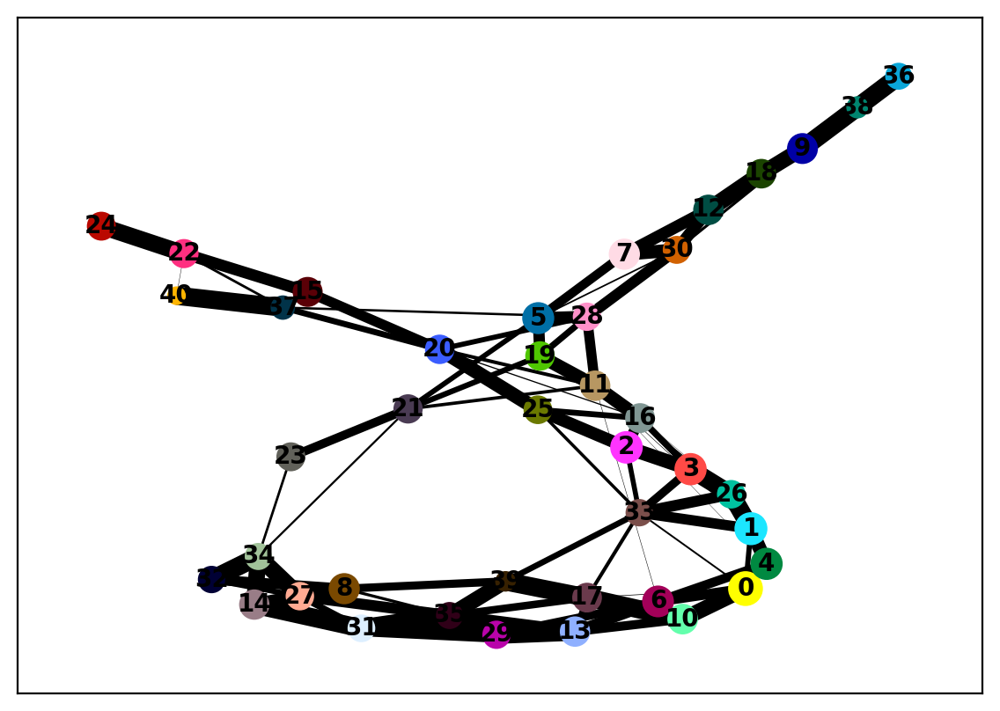

In [40]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=50)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata) 

In [41]:
sc.tl.umap(adata, init_pos='paga')

In [42]:
adata.uns['celltype_colors'] = np.array([ "#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f"], dtype=object)
adata.obs['celltype'] = pd.Categorical(adata.obs['celltype'], categories=["Stem Cell","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


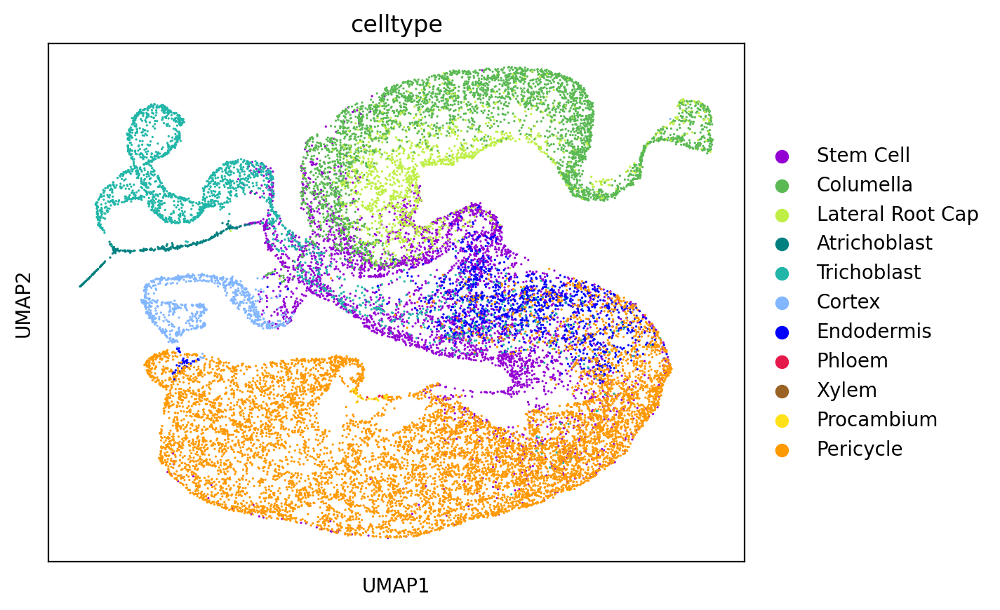

In [43]:
sc.pl.umap(adata, color=['celltype'])

In [44]:
adata.uns['timebin_colors'] = np.array([ '#5E4FA2', '#3288BD', '#66C2A5', '#ABDDA4', '#E6F598', '#FFFFBF', '#FEE08B', '#FDAE61', '#F46D43', '#D53E4F','#9E0142'])

/hpc/group/pbenfeylab/ch416/miniconda3/envs/pytorch-gpu/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


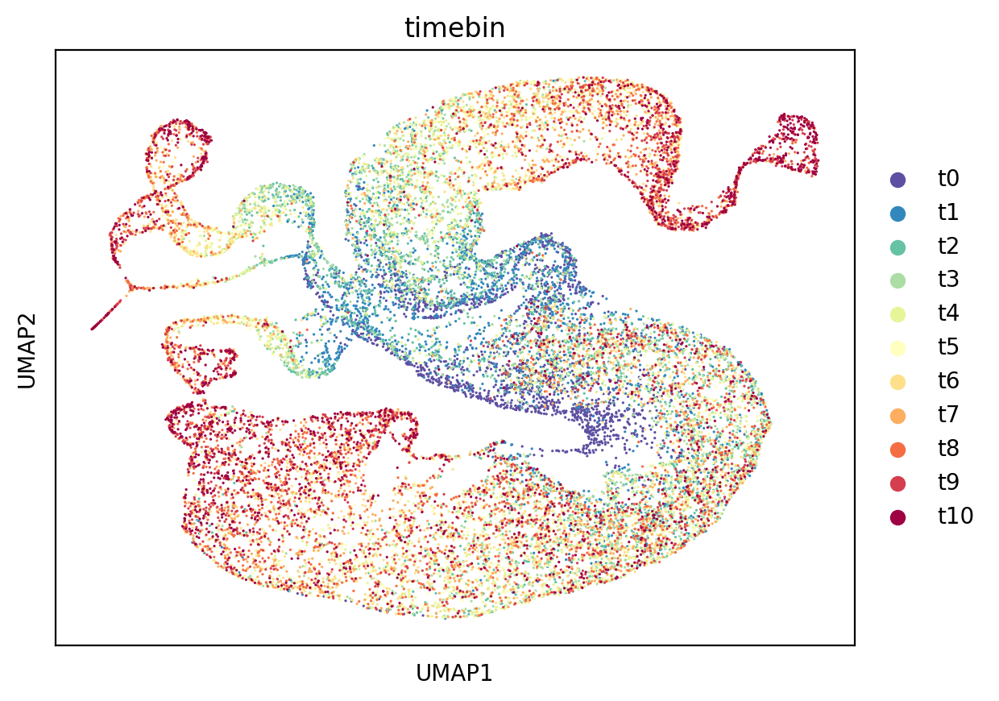

In [45]:
sc.pl.umap(adata, color=['timebin'])

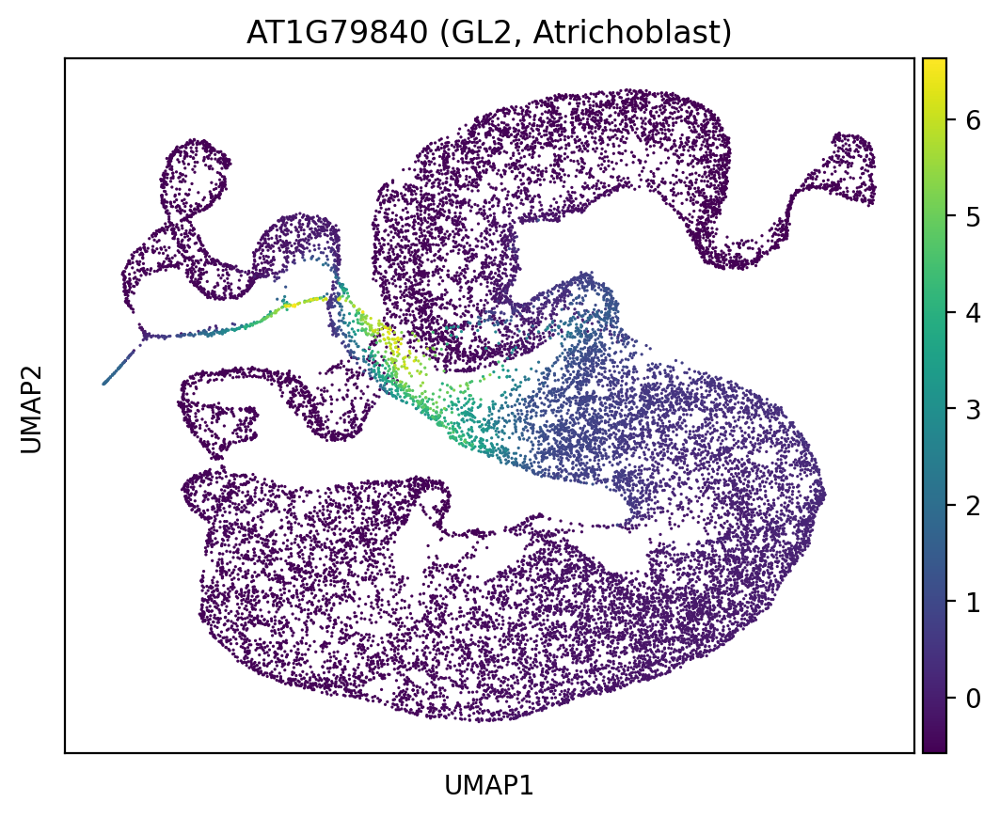

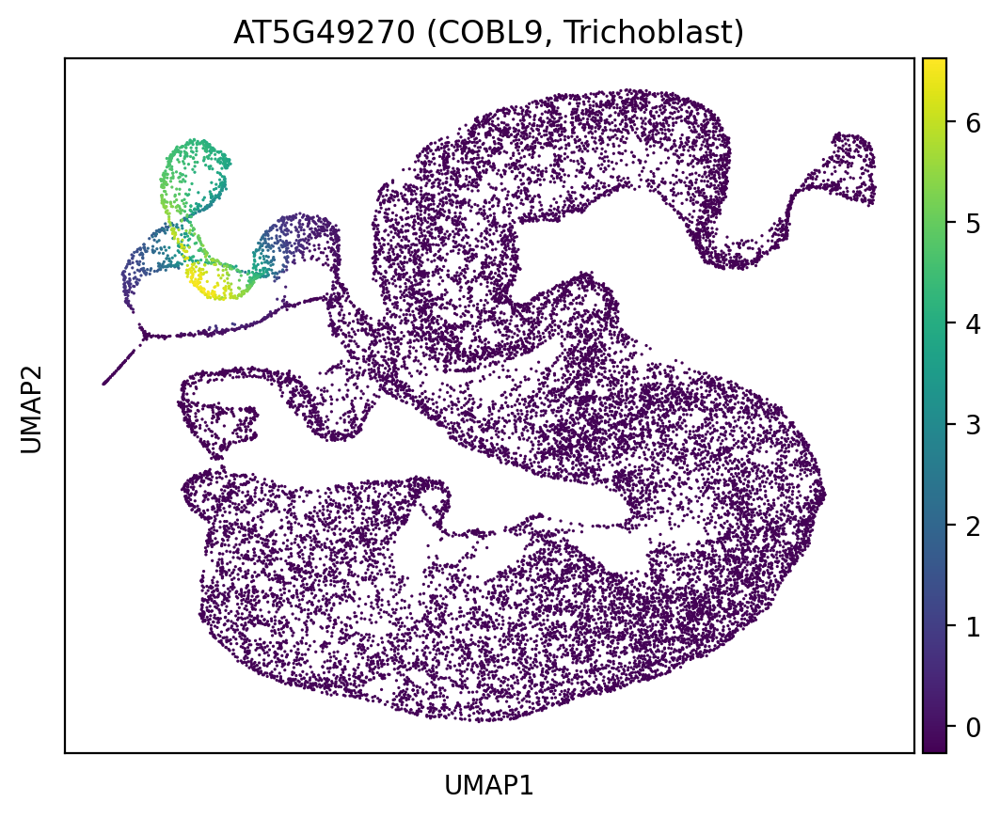

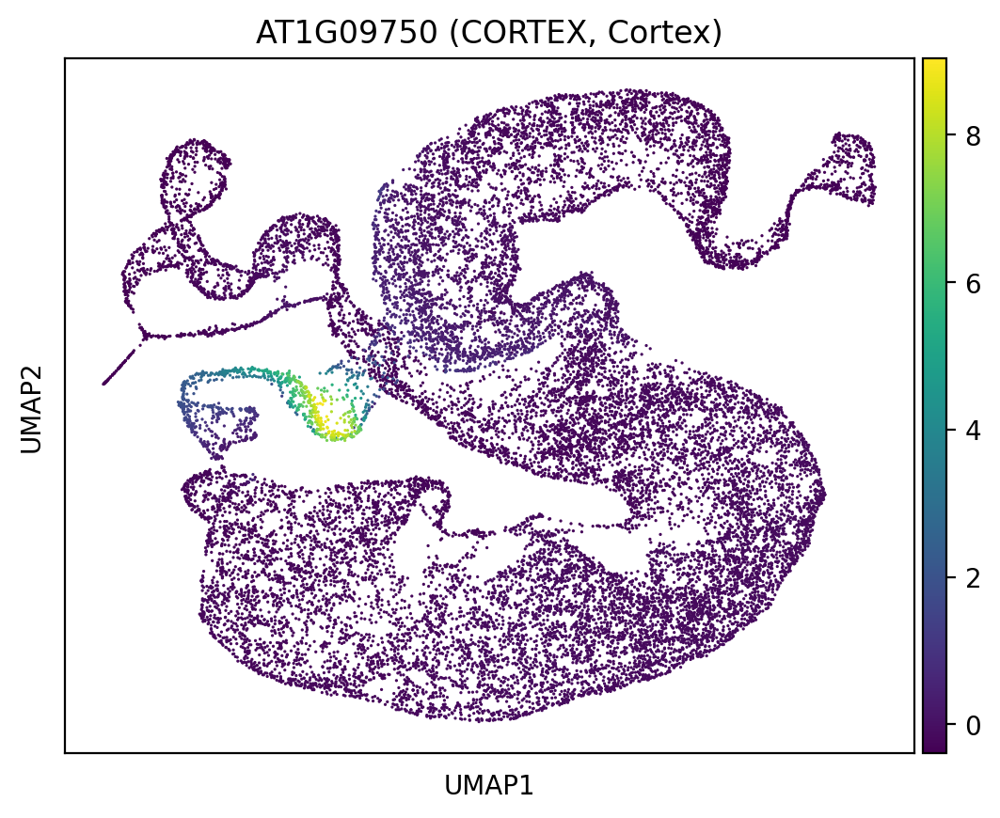

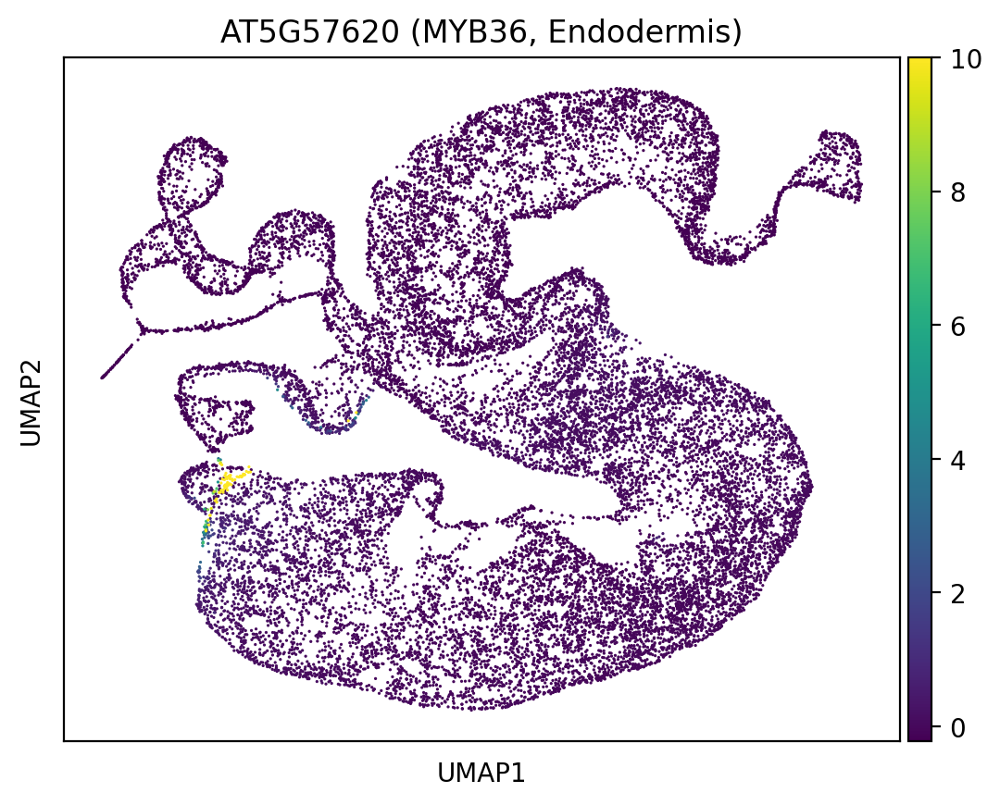

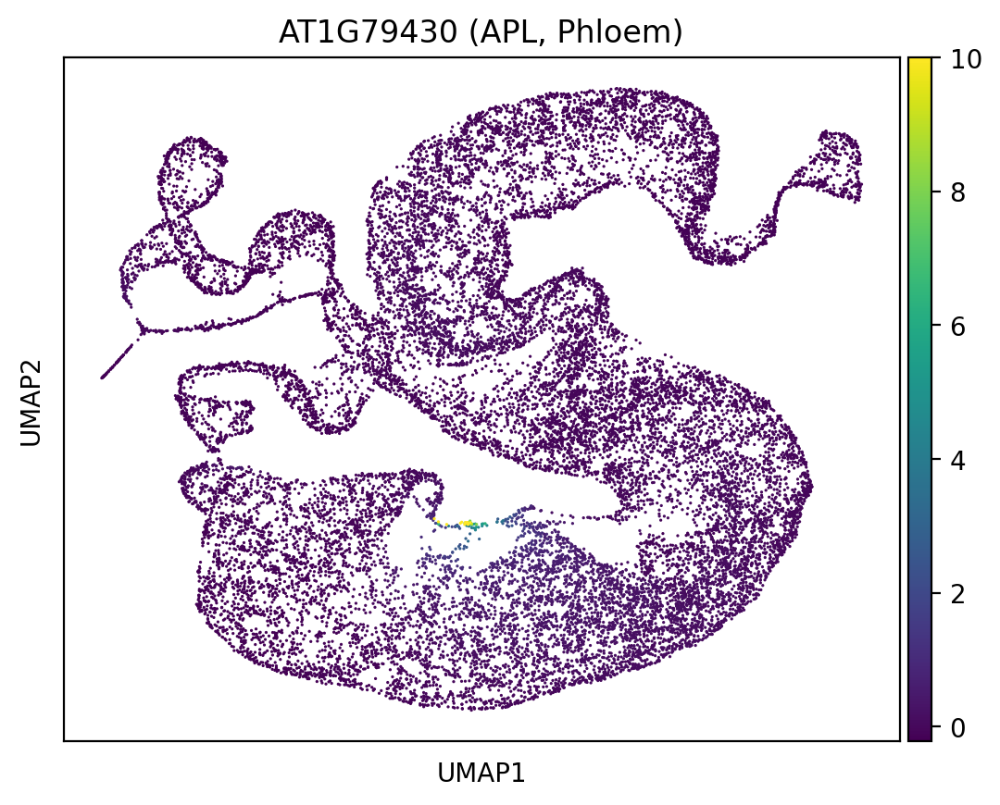

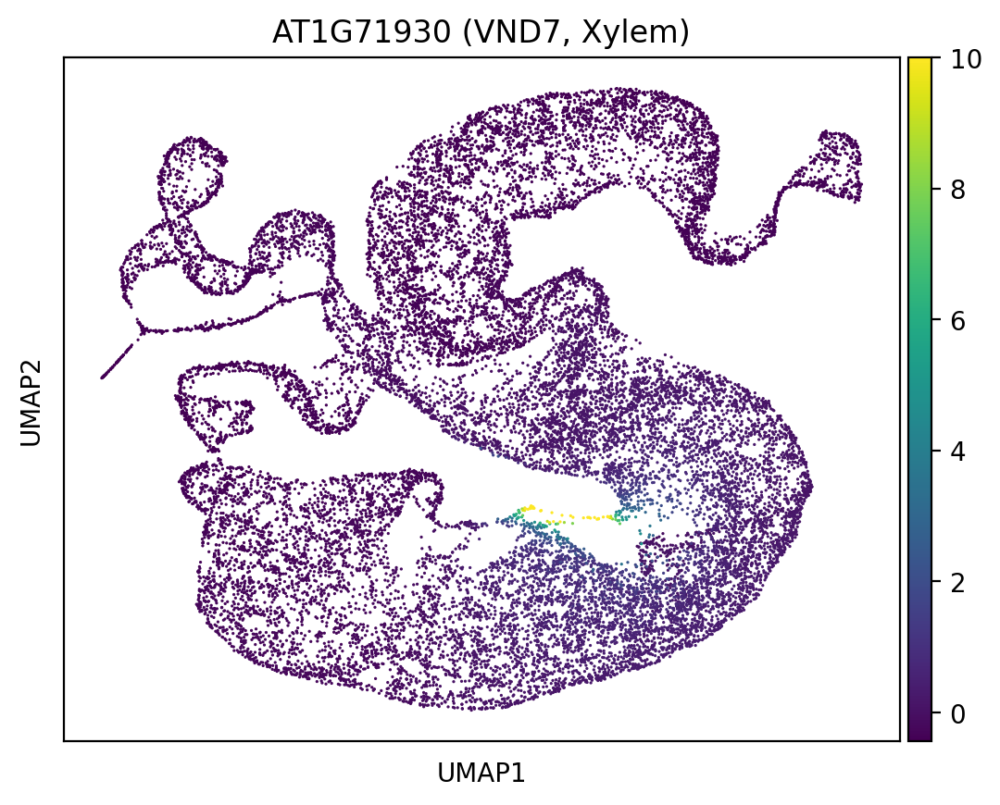

In [46]:
## AT1G79840
sc.pl.umap(adata, color='AT1G79840', title='AT1G79840 (GL2, Atrichoblast)')
## AT5G49270
sc.pl.umap(adata, color='AT5G49270', title='AT5G49270 (COBL9, Trichoblast)')
sc.pl.umap(adata, color='AT1G09750', title='AT1G09750 (CORTEX, Cortex)')
sc.pl.umap(adata, color='AT5G57620', title='AT5G57620 (MYB36, Endodermis)')
sc.pl.umap(adata, color='AT1G79430', title='AT1G79430 (APL, Phloem)')
sc.pl.umap(adata, color='AT1G71930', title='AT1G71930 (VND7, Xylem)')

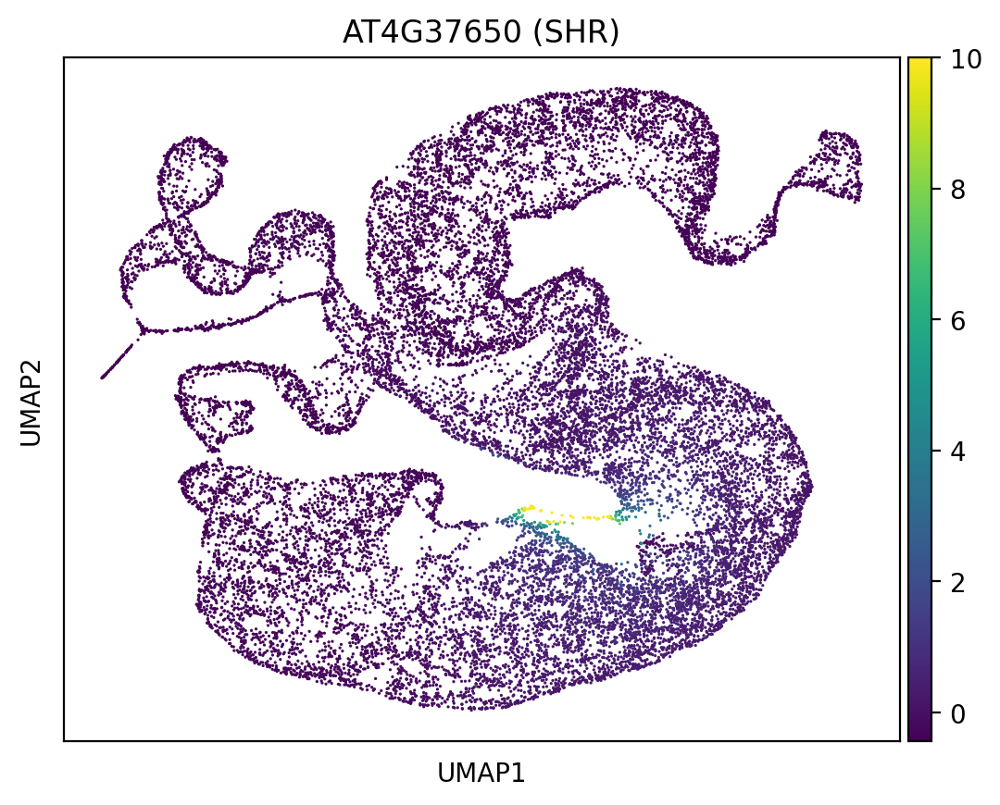

In [47]:
sc.pl.umap(adata, color='AT1G71930', title='AT4G37650 (SHR)')

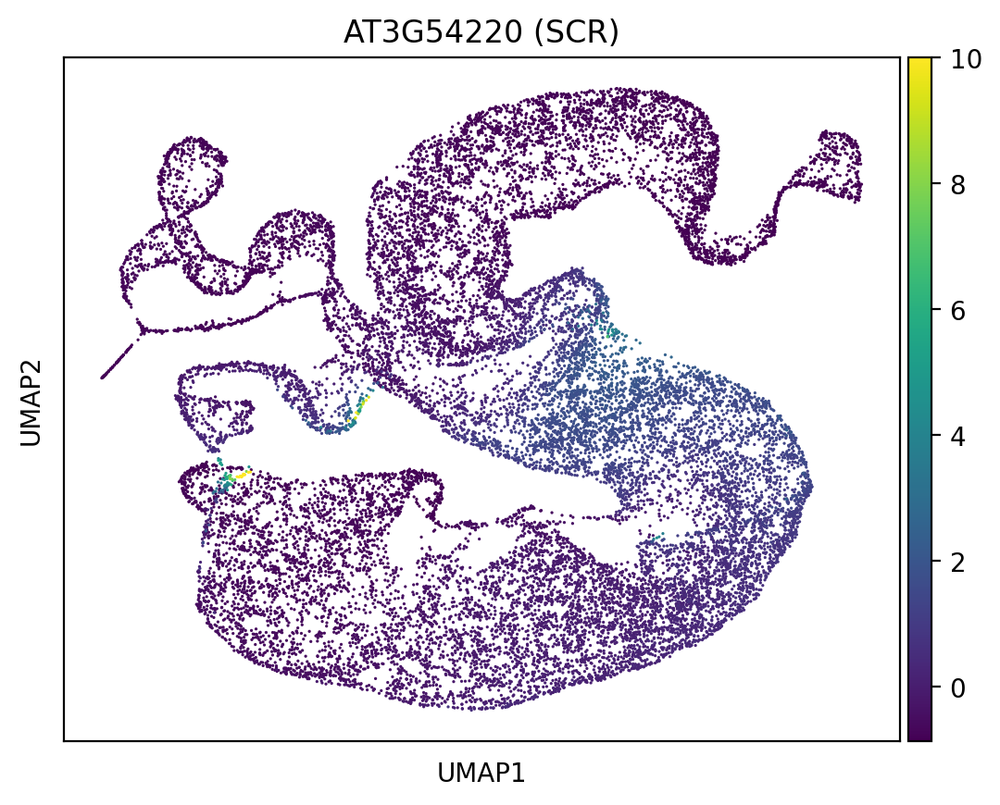

In [48]:
sc.pl.umap(adata, color='AT3G54220', title='AT3G54220 (SCR)')